In [1]:
from sentence_transformers import SentenceTransformer
import numpy as np
from tqdm import tqdm
from textwrap3 import wrap
import plotly.graph_objects as go

from data import quotes, translations

In [447]:
import plotly.express as px

In [2]:
import plotly.offline as py
py.init_notebook_mode(connected=True)

In [3]:
def wrap_text(text, width=50):
  return '<br>'.join(wrap(text, width=width))

In [4]:
def cosine_similarity(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

In [65]:
def calculate_cosine_similarity_matrix(translation_texts, translation_vectors):
    similarities = {}
    scalar_grid = []
    
    for trait1, vector1 in tqdm(zip(translation_texts, translation_vectors)):
        scalar_row = []
        for trait2, vector2 in zip(translation_texts, translation_vectors):
            key = (trait1, trait2)
            similarity = cosine_similarity(vector1, vector2)
            similarities[key] = similarity
            scalar_row.append(similarity)
        scalar_grid.append(scalar_row)
    
    cosine_similarity_matrix = np.array(scalar_grid)
    print(cosine_similarity_matrix.shape)
    return cosine_similarity_matrix

In [66]:
def display_cosine_similarity_matrix(labels, cosine_similarity_matrix, cutoff, char_limit=None):
    cosine_similarity_matrix[cosine_similarity_matrix < cutoff] = 0
    
    cdy = []
    for text in labels:
        row = []
        for _ in range(len(labels)):
            row.append(wrap_text(text[:char_limit]))
        cdy.append(row)
    
    cdx = []
    for _ in range(len(labels)):
        row = []
        for text in labels:
            row.append(wrap_text(text[:char_limit]))
        cdx.append(row)

    customdata = np.dstack((cdx, cdy))
    
    fig = go.Figure(
        data=go.Heatmap(
            z=cosine_similarity_matrix,
            zmin=0,
            zmax=1,
            customdata=customdata,
            hovertemplate='<b>similarity:%{z:.3f}</b><br><br>x-text:%{customdata[0]}<br><br>y-text: %{customdata[1]}',
        )
    )
    return fig

In [67]:
def calculate_and_display_cosine_similarity_matrix(translation_texts, translation_vectors, cutoff=0.5, char_limit=None):
    cosine_similarity_matrix = calculate_cosine_similarity_matrix(translation_texts, translation_vectors)
    fig = display_cosine_similarity_matrix(translation_texts, cosine_similarity_matrix, cutoff, char_limit=char_limit)
    return fig

In [8]:
model = SentenceTransformer("all-MiniLM-L6-v2")

In [9]:
translation_texts = [d["text"] for d in translations]

In [10]:
translation_vectors = model.encode(translation_texts)

In [11]:
for translation, vector in zip(translations, translation_vectors):
    translation["vector"] = vector

In [620]:
calculate_and_display_cosine_similarity_matrix(translation_texts, translation_vectors, cutoff=0.5)

72it [00:00, 1873.29it/s]


(72, 72)


In [13]:
import pandas as pd

In [14]:
df = pd.DataFrame(translations)

In [15]:
df

,id,text,quote_id,vector,language,book_id
0,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",en,0
1,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",en,1
2,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",en,2
3,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",en,3
4,4.0,"We must be content, then, in speaking of such ...",1,"[0.030384408, 0.03830256, 0.032472678, 0.03094...",en,0
...,...,...,...,...,...,...
67,NaN,But since rest [or relaxation] too is a part o...,16,"[0.09492637, 0.011845015, 0.050410967, -0.0535...",en,3
68,NaN,Shame should not be described as a virtue; for...,17,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...",en,0
69,NaN,"To speak of Shame as a Virtue is incorrect, be...",17,"[0.035061073, 0.03301282, -0.006102627, 0.0407...",en,1
70,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",en,2


In [16]:
translation_avg_vs = df.groupby("quote_id").agg({"vector": "mean"})

In [17]:
translation_avg_vs["text"] = "translation_average"

In [18]:
translation_avg_vs.reset_index()

,quote_id,vector,text
0,0,"[0.06277847290039062, 0.006201472133398056, 0....",translation_average
1,1,"[0.017795706167817116, 0.048283062875270844, 0...",translation_average
2,2,"[0.07719572633504868, 0.10485044866800308, -0....",translation_average
3,3,"[0.03362242877483368, 0.04007047414779663, -0....",translation_average
4,4,"[0.02415522187948227, 0.008737727999687195, -0...",translation_average
5,5,"[0.07610045373439789, 0.06529548019170761, -0....",translation_average
6,6,"[0.03293563053011894, 0.01995071955025196, 0.0...",translation_average
7,7,"[0.05080147087574005, 0.10202674567699432, -0....",translation_average
8,8,"[0.06137305125594139, 0.006635439116507769, -0...",translation_average
9,9,"[0.04791618883609772, 0.03983806446194649, -0....",translation_average


In [19]:
ok = pd.concat([df, translation_avg_vs.reset_index()]).sort_values(["quote_id", "book_id"])

In [20]:
ok

,id,text,quote_id,vector,language,book_id
0,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",en,0.0
1,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",en,1.0
2,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",en,2.0
3,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",en,3.0
0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,NaN
...,...,...,...,...,...,...
68,NaN,Shame should not be described as a virtue; for...,17,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...",en,0.0
69,NaN,"To speak of Shame as a Virtue is incorrect, be...",17,"[0.035061073, 0.03301282, -0.006102627, 0.0407...",en,1.0
70,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",en,2.0
71,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",en,3.0


In [21]:
plot_df = ok[ok["quote_id"].isin([1,2]) ]

In [22]:
calculate_and_display_cosine_similarity_matrix(plot_df["text"].to_list(), plot_df["vector"].to_list(), char_limit=400)

10it [00:00, 7892.93it/s]


# Find two most and least similar quotes for a translation

In [217]:
df = df.drop(columns=["id"]).reset_index(names="id")

In [218]:
df

,id,text,quote_id,vector,language,book_id
0,0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",en,0
1,1,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",en,1
2,2,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",en,2
3,3,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",en,3
4,4,"We must be content, then, in speaking of such ...",1,"[0.030384408, 0.03830256, 0.032472678, 0.03094...",en,0
5,5,"We must be content then, in speaking of such t...",1,"[0.0031615484, 0.0472987, -0.0059349583, 0.013...",en,1
6,6,Therefore in discussing subjects and arguing f...,1,"[0.03187444, 0.06406835, 0.029224, 0.014226699...",en,2
7,7,"It would certainly be desirable enough, then, ...",1,"[0.0057624285, 0.043462653, -0.008210929, -0.0...",en,3
8,8,Hence a young man is not a proper hearer of le...,2,"[0.062188793, 0.107495464, -0.015191234, 0.017...",en,0
9,9,Hence the young man is not a fit student of Mo...,2,"[0.069295146, 0.118524015, -0.07344557, 0.0014...",en,1


In [342]:
cross_cols = ["id", "text", "quote_id", "book_id", "vector"]
crossed = df[cross_cols].merge(df[cross_cols], how="cross")[["id_x", "id_y", "quote_id_x", "quote_id_y", "book_id_x", "book_id_y", "text_x", "text_y", "vector_x", "vector_y"]]

In [343]:
crossed

,id_x,id_y,quote_id_x,quote_id_y,book_id_x,book_id_y,text_x,text_y,vector_x,vector_y
0,0,0,0,0,0,0,"Every art and every inquiry, and similarly eve...","Every art and every inquiry, and similarly eve...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.067723036, 0.0053726034, -0.0019922277, -0...."
1,0,1,0,0,0,1,"Every art and every inquiry, and similarly eve...","Every art, and every science reduced to a teac...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.043386947, 0.028252663, 0.0019536903, -0.03..."
2,0,2,0,0,0,2,"Every art and every inquiry, and similarly eve...","Every art and every investigation, and similar...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.06353351, -0.00046575806, -0.0013663276, -0..."
3,0,3,0,0,0,3,"Every art and every inquiry, and similarly eve...","Every art and every inquiry, and similarly eve...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.07647041, -0.00835362, 0.011748879, -0.0462..."
4,0,4,0,1,0,0,"Every art and every inquiry, and similarly eve...","We must be content, then, in speaking of such ...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.030384408, 0.03830256, 0.032472678, 0.03094..."
...,...,...,...,...,...,...,...,...,...,...
5179,71,67,17,16,3,3,It is not fitting to speak about a sense of sh...,But since rest [or relaxation] too is a part o...,"[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.09492637, 0.011845015, 0.050410967, -0.0535..."
5180,71,68,17,17,3,0,It is not fitting to speak about a sense of sh...,Shame should not be described as a virtue; for...,"[0.009842148, 0.027751027, 0.03613974, 0.06778...","[-0.0040379125, 0.02900942, 0.041195996, 0.061..."
5181,71,69,17,17,3,1,It is not fitting to speak about a sense of sh...,"To speak of Shame as a Virtue is incorrect, be...","[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.035061073, 0.03301282, -0.006102627, 0.0407..."
5182,71,70,17,17,3,2,It is not fitting to speak about a sense of sh...,It is not correct to speak of modesty as a kin...,"[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.07477189, 0.06466378, -0.001127524, 0.05559..."


In [344]:
# remove comparisons of translations with themselves
crossed = crossed[crossed["id_x"] != crossed["id_y"]]
crossed

,id_x,id_y,quote_id_x,quote_id_y,book_id_x,book_id_y,text_x,text_y,vector_x,vector_y
1,0,1,0,0,0,1,"Every art and every inquiry, and similarly eve...","Every art, and every science reduced to a teac...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.043386947, 0.028252663, 0.0019536903, -0.03..."
2,0,2,0,0,0,2,"Every art and every inquiry, and similarly eve...","Every art and every investigation, and similar...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.06353351, -0.00046575806, -0.0013663276, -0..."
3,0,3,0,0,0,3,"Every art and every inquiry, and similarly eve...","Every art and every inquiry, and similarly eve...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.07647041, -0.00835362, 0.011748879, -0.0462..."
4,0,4,0,1,0,0,"Every art and every inquiry, and similarly eve...","We must be content, then, in speaking of such ...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.030384408, 0.03830256, 0.032472678, 0.03094..."
5,0,5,0,1,0,1,"Every art and every inquiry, and similarly eve...","We must be content then, in speaking of such t...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.0031615484, 0.0472987, -0.0059349583, 0.013..."
...,...,...,...,...,...,...,...,...,...,...
5178,71,66,17,16,3,2,It is not fitting to speak about a sense of sh...,"Since one part of life is relaxation, and one ...","[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.052157663, 0.03719874, 0.03584524, -0.05000..."
5179,71,67,17,16,3,3,It is not fitting to speak about a sense of sh...,But since rest [or relaxation] too is a part o...,"[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.09492637, 0.011845015, 0.050410967, -0.0535..."
5180,71,68,17,17,3,0,It is not fitting to speak about a sense of sh...,Shame should not be described as a virtue; for...,"[0.009842148, 0.027751027, 0.03613974, 0.06778...","[-0.0040379125, 0.02900942, 0.041195996, 0.061..."
5181,71,69,17,17,3,1,It is not fitting to speak about a sense of sh...,"To speak of Shame as a Virtue is incorrect, be...","[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.035061073, 0.03301282, -0.006102627, 0.0407..."


In [345]:
# remove comparisons of different quotes
crossed = crossed[crossed["quote_id_x"] == crossed["quote_id_y"]]
crossed

,id_x,id_y,quote_id_x,quote_id_y,book_id_x,book_id_y,text_x,text_y,vector_x,vector_y
1,0,1,0,0,0,1,"Every art and every inquiry, and similarly eve...","Every art, and every science reduced to a teac...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.043386947, 0.028252663, 0.0019536903, -0.03..."
2,0,2,0,0,0,2,"Every art and every inquiry, and similarly eve...","Every art and every investigation, and similar...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.06353351, -0.00046575806, -0.0013663276, -0..."
3,0,3,0,0,0,3,"Every art and every inquiry, and similarly eve...","Every art and every inquiry, and similarly eve...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.07647041, -0.00835362, 0.011748879, -0.0462..."
72,1,0,0,0,1,0,"Every art, and every science reduced to a teac...","Every art and every inquiry, and similarly eve...","[0.043386947, 0.028252663, 0.0019536903, -0.03...","[0.067723036, 0.0053726034, -0.0019922277, -0...."
74,1,2,0,0,1,2,"Every art, and every science reduced to a teac...","Every art and every investigation, and similar...","[0.043386947, 0.028252663, 0.0019536903, -0.03...","[0.06353351, -0.00046575806, -0.0013663276, -0..."
...,...,...,...,...,...,...,...,...,...,...
5109,70,69,17,17,2,1,It is not correct to speak of modesty as a kin...,"To speak of Shame as a Virtue is incorrect, be...","[0.07477189, 0.06466378, -0.001127524, 0.05559...","[0.035061073, 0.03301282, -0.006102627, 0.0407..."
5111,70,71,17,17,2,3,It is not correct to speak of modesty as a kin...,It is not fitting to speak about a sense of sh...,"[0.07477189, 0.06466378, -0.001127524, 0.05559...","[0.009842148, 0.027751027, 0.03613974, 0.06778..."
5180,71,68,17,17,3,0,It is not fitting to speak about a sense of sh...,Shame should not be described as a virtue; for...,"[0.009842148, 0.027751027, 0.03613974, 0.06778...","[-0.0040379125, 0.02900942, 0.041195996, 0.061..."
5181,71,69,17,17,3,1,It is not fitting to speak about a sense of sh...,"To speak of Shame as a Virtue is incorrect, be...","[0.009842148, 0.027751027, 0.03613974, 0.06778...","[0.035061073, 0.03301282, -0.006102627, 0.0407..."


In [346]:
# remove inverse duplicates i.e. only have one of (a,b) and (b,a)
crossed["pair_key"] = crossed[["id_x", "id_y"]].apply(frozenset, axis=1)
crossed = crossed.drop_duplicates("pair_key").drop(columns=["pair_key"])

/var/folders/f_/5lhk2_3x1ld__zxf14_jx42m0000gn/T/ipykernel_33263/3701453623.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [347]:
crossed["cos_sim"] = crossed.apply(lambda row: cosine_similarity(row["vector_x"], row["vector_y"]), axis=1)

In [348]:
crossed.sort_values(["quote_id_x", "cos_sim"], ascending=[True, False])

,id_x,id_y,quote_id_x,quote_id_y,book_id_x,book_id_y,text_x,text_y,vector_x,vector_y,cos_sim
3,0,3,0,0,0,3,"Every art and every inquiry, and similarly eve...","Every art and every inquiry, and similarly eve...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.07647041, -0.00835362, 0.011748879, -0.0462...",0.921333
2,0,2,0,0,0,2,"Every art and every inquiry, and similarly eve...","Every art and every investigation, and similar...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.06353351, -0.00046575806, -0.0013663276, -0...",0.898262
147,2,3,0,0,2,3,"Every art and every investigation, and similar...","Every art and every inquiry, and similarly eve...","[0.06353351, -0.00046575806, -0.0013663276, -0...","[0.07647041, -0.00835362, 0.011748879, -0.0462...",0.888366
1,0,1,0,0,0,1,"Every art and every inquiry, and similarly eve...","Every art, and every science reduced to a teac...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.043386947, 0.028252663, 0.0019536903, -0.03...",0.829923
75,1,3,0,0,1,3,"Every art, and every science reduced to a teac...","Every art and every inquiry, and similarly eve...","[0.043386947, 0.028252663, 0.0019536903, -0.03...","[0.07647041, -0.00835362, 0.011748879, -0.0462...",0.797265
...,...,...,...,...,...,...,...,...,...,...,...
4967,68,71,17,17,0,3,Shame should not be described as a virtue; for...,It is not fitting to speak about a sense of sh...,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...","[0.009842148, 0.027751027, 0.03613974, 0.06778...",0.893122
5039,69,71,17,17,1,3,"To speak of Shame as a Virtue is incorrect, be...",It is not fitting to speak about a sense of sh...,"[0.035061073, 0.03301282, -0.006102627, 0.0407...","[0.009842148, 0.027751027, 0.03613974, 0.06778...",0.831779
4966,68,70,17,17,0,2,Shame should not be described as a virtue; for...,It is not correct to speak of modesty as a kin...,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...","[0.07477189, 0.06466378, -0.001127524, 0.05559...",0.533468
5111,70,71,17,17,2,3,It is not correct to speak of modesty as a kin...,It is not fitting to speak about a sense of sh...,"[0.07477189, 0.06466378, -0.001127524, 0.05559...","[0.009842148, 0.027751027, 0.03613974, 0.06778...",0.532607


In [349]:
# confirm there are no comparisons across quotes, and quote_id_x == quote_id_y
(crossed[crossed["quote_id_x"] == crossed["quote_id_y"]] == crossed).all().all() == True

np.True_

In [350]:
crossed

,id_x,id_y,quote_id_x,quote_id_y,book_id_x,book_id_y,text_x,text_y,vector_x,vector_y,cos_sim
1,0,1,0,0,0,1,"Every art and every inquiry, and similarly eve...","Every art, and every science reduced to a teac...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.043386947, 0.028252663, 0.0019536903, -0.03...",0.829923
2,0,2,0,0,0,2,"Every art and every inquiry, and similarly eve...","Every art and every investigation, and similar...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.06353351, -0.00046575806, -0.0013663276, -0...",0.898262
3,0,3,0,0,0,3,"Every art and every inquiry, and similarly eve...","Every art and every inquiry, and similarly eve...","[0.067723036, 0.0053726034, -0.0019922277, -0....","[0.07647041, -0.00835362, 0.011748879, -0.0462...",0.921333
74,1,2,0,0,1,2,"Every art, and every science reduced to a teac...","Every art and every investigation, and similar...","[0.043386947, 0.028252663, 0.0019536903, -0.03...","[0.06353351, -0.00046575806, -0.0013663276, -0...",0.785087
75,1,3,0,0,1,3,"Every art, and every science reduced to a teac...","Every art and every inquiry, and similarly eve...","[0.043386947, 0.028252663, 0.0019536903, -0.03...","[0.07647041, -0.00835362, 0.011748879, -0.0462...",0.797265
...,...,...,...,...,...,...,...,...,...,...,...
4966,68,70,17,17,0,2,Shame should not be described as a virtue; for...,It is not correct to speak of modesty as a kin...,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...","[0.07477189, 0.06466378, -0.001127524, 0.05559...",0.533468
4967,68,71,17,17,0,3,Shame should not be described as a virtue; for...,It is not fitting to speak about a sense of sh...,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...","[0.009842148, 0.027751027, 0.03613974, 0.06778...",0.893122
5038,69,70,17,17,1,2,"To speak of Shame as a Virtue is incorrect, be...",It is not correct to speak of modesty as a kin...,"[0.035061073, 0.03301282, -0.006102627, 0.0407...","[0.07477189, 0.06466378, -0.001127524, 0.05559...",0.500979
5039,69,71,17,17,1,3,"To speak of Shame as a Virtue is incorrect, be...",It is not fitting to speak about a sense of sh...,"[0.035061073, 0.03301282, -0.006102627, 0.0407...","[0.009842148, 0.027751027, 0.03613974, 0.06778...",0.831779


In [378]:
# Be able to see the whole contents of a cell
pd.set_option('display.max_colwidth', None)

In [365]:
# get the row with max cosine similarity for each group
max_cos_sim = crossed[["quote_id_x", "cos_sim"]].groupby("quote_id_x").transform("max")

In [366]:
crossed["cos_sim"] == max_cos_sim["cos_sim"]

1       False
2       False
3        True
74      False
75      False
        ...  
4966    False
4967    False
5038    False
5039    False
5111    False
Name: cos_sim, Length: 108, dtype: bool

In [433]:
most_similar_translations = crossed[crossed["cos_sim"] == max_cos_sim["cos_sim"]]
most_similar_translations[["quote_id_x", "book_id_x", "text_x", "text_y", "book_id_y", "cos_sim"]].sort_values("cos_sim", ascending=True)

,quote_id_x,book_id_x,text_x,text_y,book_id_y,cos_sim
3943,13,2,"Patience is an intermediate state with regard to anger. The mean is really nameless, and the extremes nearly so; but we apply the name patience to the mean, although it tends towards describing the deficiency, which also lacks a name.","Gentleness is a mean with respect to anger. Since the middle term is nameless, as the extremes also pretty much are, we confer the name ""gentleness"" on the middle term, since it inclines in the direction of the deficiency, which is nameless.",3,0.586901
1754,6,0,"We must, however, not only make this general statement, but also apply it to the individual facts. For among statements about conduct those which are general apply more widely, but those which are particular are more genuine, since conduct has to do with individual cases, and our statements must harmonize with the facts in these cases.","But a generalization of this kind is not enough; we must apply it to particular cases. When we are discussing actions, although general statements have a wider application, particular statements are closer to the truth. This is because actions are concerned with particular facts, and theories must be brought into harmony with these.",2,0.716624
879,3,0,"Since, then, the present inquiry does not aim at theoretical knowledge like the others (for we are inquiring not in order to know what virtue is, but in order to become good, since otherwise our inquiry would have been of no use), we must examine the nature of actions, namely how we ought to do them; for these determine also the nature of the states of character that are produced, as we have said.","Now, since the present subject is taken up, not for the sake of contemplation, as others are -- for we are conducting an examination, not so that we may know what virtue is, but so that we may become good, since otherwise there would be no benefit from it -- it is necessary to examine matters pertaining to actions, that is, how one ought to perform them.",3,0.735067
1170,4,0,"Let us resume our inquiry and state, in view of the fact that all knowledge and every pursuit aims at some good, what it is that we say political science aims at and what is the highest of all goods achievable by action.","To resume. Since all knowledge and every pursuit aim at some good, what do we take to be the end of political science -- what is the highest of all practical goods?",2,0.753065
4673,16,0,"Since life includes rest as well as activity, and in this is included leisure and amusement, there seems here also to be a kind of intercourse which is tasteful; there is such a thing as saying- and again listening to- what one should and as one should. The kind of people one is speaking or listening to will also make a difference. Evidently here also there is both an excess and a deficiency as compared with the mean.","Next, as life has its pauses and in them admits of pastime combined with Jocularity, it is thought that in this respect also there is a kind of fitting intercourse, and that rules may be prescribed as to the kind of things one should say and the manner of saying them; and in respect of hearing likewise (and there will be a difference between the saying and hearing such and such things). It is plain that in regard to these things also there will be an excess and defect and a mean.",1,0.758421
4527,15,2,"The same field of action, roughly speaking, belongs to the disposition intermediate between boasting and understatement... Let us now deal similarly with those who exhibit truth and falsehood in their speech and actions, i.e. in their pretensions. Well, the boaster is regarded as one who pretends to have distinguished qualities which he possesses either not at all or to a lesser degree than he pretends. The ironical man conversely is thought to disclaim qualities that he does possess, or to depreciate them; while the one who is intermediate between these two is a sort of individualist, sincere both in hi

In [354]:
# get the row with min cosine similarity for each group
min_cos_sim = crossed[["quote_id_x", "cos_sim"]].groupby("quote_id_x").transform("min")
min_cos_sim

,cos_sim
1,0.785087
2,0.785087
3,0.785087
74,0.785087
75,0.785087
...,...
4966,0.500979
4967,0.500979
5038,0.500979
5039,0.500979


In [434]:
least_similar_translations = crossed[crossed.cos_sim == min_cos_sim.cos_sim]
least_similar_translations[["quote_id_x", "book_id_x", "text_x", "text_y", "book_id_y", "cos_sim"]].sort_values("cos_sim", ascending=False)

,quote_id_x,book_id_x,text_x,text_y,book_id_y,cos_sim
2119,7,1,"First, then, of Courage. Now that it is a mean state, in respect of fear and boldness, has been already said: further, the objects of our fears are obviously things fearful or, in a general way of statement, evils; which accounts for the common definition of fear, viz. “expectation of evil.” Of course we fear evils of all kinds: disgrace, for instance, poverty, disease, desolateness, death; but not all these seem to be the object-matter of the Brave man, because there are things which to fear is right and noble, and not to fear is base; disgrace, for example, since he who fears this is a good man and has a sense of honour, and he who does not fear it is shameless...","And first let us speak about courage. Now, that it is a mean with respect to fear and confidence has already become apparent. It is clear that we fear frightening things, and tehse are, to speak unqualifiedly, bad things. Hence people also define fear as the anticipation of a bad thing. We fear, then, all the bad things -- for example, disrepute, poverty, sickness, friendlessness, and death -- but the courageous person is not held to be concerned witha ll of these. For some thigns one even out to fear, and it is noble to do so and shameful not to -- for example, disrepute, since he who fears this is decent and bashful, whereas he who does not is shameless...",3,0.866218
1534,5,1,"Virtue then is “a state apt to exercise deliberate choice, being in the relative mean, determined by reason, and as the man of practical wisdom would determine.”","So virtue is a purposive disposition, lying in a mean that is related to us and determined by a rational princple, and by that which a prudent man would use to deteremine it.",2,0.815650
74,0,1,"Every art, and every science reduced to a teachable form, and in like manner every action and moral choice, aims, it is thought, at some good: for which reason a common and by no means a bad description of the Chief Good is, ""that which all things aim at."" Now there plainly is a difference in the Ends proposed...","Every art and every investigation, and similarly every action and pursuit, is considered to aim at some good. Hence the good has been rightly defined as 'that at which all things aim'. Clearly, however, there is some difference between the ends at which they aim...",2,0.785087
3506,12,0,"There seems to be in the sphere of honour also, as was said in our first remarks on the subject, a virtue which would appear to be related to pride as liberality is to magnificence. For neither of these has anything to do with the grand scale, but both dispose us as is right with regard to middling and unimportant objects; as in getting and giving of wealth there is a mean and an excess and defect, so too honour may be desired more than is right, or less, or from the right sources and in the right way.","It seems, however, that in the spehere of honour too there is a kind of virtue, as we said at the beginning, which may be regarded as related to magnanimity in much the same way as liberality is to magnificence. For both these states are unconcerned with greatness, but dispose us in the right way towards matters of moderate or little importance. Just as in the receiving and giving of money there is a mean and an excess and a deficiency, so also in the desire for honour there are degrees of too much and too little, and a right source and a right manner.",2,0.728033
2702,9,1,"We will next speak of Liberality. Now this is thought to be the mean state, having for its object-matter Wealth: I mean, the Liberal man is praised not in the circumstances of war, nor in those which constitute the character of perfected self-mastery, nor again in judicial decisions, but in respect of giving and receiving Wealth, chiefly the former. By the term Wealth I mean “all those things whose worth is measured by money.”","Let us speak about liberality. It seems to be the intermediate disposition with

In [576]:
translation_vectors_norm = np.sqrt((translation_vectors**2).sum(axis=1))
translation_vectors_norm

array([1.        , 1.        , 0.99999994, 1.        , 1.        ,
       0.9999999 , 0.99999994, 1.        , 1.        , 1.        ,
       1.        , 0.99999994, 1.        , 1.        , 1.        ,
       0.99999994, 1.        , 0.99999994, 1.        , 1.        ,
       1.        , 0.99999994, 0.99999994, 1.        , 1.        ,
       0.99999994, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 0.99999994, 1.        ,
       1.0000001 , 1.        , 1.        , 0.99999994, 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.99999994,
       1.        , 0.99999994, 0.99999994, 1.        , 0.99999994,
       1.        , 0.99999994, 1.        , 1.        , 1.        ,
       0.99999994, 1.        , 0.99999994, 1.        , 0.99999994,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 0.99999994], dtype=float32)

In [589]:
normed_translation_vectors = translation_vectors / np.expand_dims(translation_vectors_norm, axis=0).transpose()

In [590]:
n_components = 2
mds = MDS(n_components=n_components)

In [591]:
X_reduced = mds.fit_transform(normed_translation_vectors)
# X_reduced = mds.fit_transform(translation_vectors)

In [592]:
mds_df = pd.concat([pd.DataFrame(X_reduced), df[["quote_id", "book_id"]]], axis=1).rename(columns={0: "x", 1:"y"})

In [593]:
plot_mds_df = mds_df

In [594]:
subset_inds = [0,1, 2, 3, 4, 5, 6, 7]

In [617]:
# subset_inds = [7,8, 9, 10, 11]
plot_mds_df = mds_df[df.quote_id.isin(subset_inds)]
plot_mds_df.loc[:, "quote_id"] = plot_mds_df.quote_id.astype(str)
fig = px.scatter(plot_mds_df, 
                 x="x", 
                 y="y", 
                 color="quote_id", 
                 hover_data=['book_id'],
                 range_x=[-1.2, 1.2],
                 range_y=[-1.2, 1.2],
                )
fig

/var/folders/f_/5lhk2_3x1ld__zxf14_jx42m0000gn/T/ipykernel_33263/1595990329.py:3: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['0' '0' '0' '0' '1' '1' '1' '1' '2' '2' '2' '2' '3' '3' '3' '3' '4' '4'
 '4' '4' '5' '5' '5' '5' '6' '6' '6' '6' '7' '7' '7' '7']' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [597]:
df[df.quote_id == 6].drop(columns=["vector"])

,id,text,quote_id,language,book_id
24,24,"We must, however, not only make this general statement, but also apply it to the individual facts. For among statements about conduct those which are general apply more widely, but those which are particular are more genuine, since conduct has to do with individual cases, and our statements must harmonize with the facts in these cases.",6,en,0
25,25,"It is not enough, however, to state this in general terms, we must also apply it to particular instances, because in treatises on moral conduct general statements have an air of vagueness, but those which go into detail one of greater reality: for the actions after all must be in detail, and the general statements, to be worth anything, must hold good here.",6,en,1
26,26,"But a generalization of this kind is not enough; we must apply it to particular cases. When we are discussing actions, although general statements have a wider application, particular statements are closer to the truth. This is because actions are concerned with particular facts, and theories must be brought into harmony with these.",6,en,2
27,27,"One must not only state this [definition] in general terms but also make it harmonize with the particulars involved. For in the case of arguments concerning actions, the general arguments are of wider application, whereas those pertaining to a part are truer: actions concern particulars and it is with these that the arguments ought to accord.",6,en,3


Original Dimesnion of X =  (1797, 64)
Dimesnion of X after MDS =  (1797, 2)


/var/folders/f_/5lhk2_3x1ld__zxf14_jx42m0000gn/T/ipykernel_33263/4263253741.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



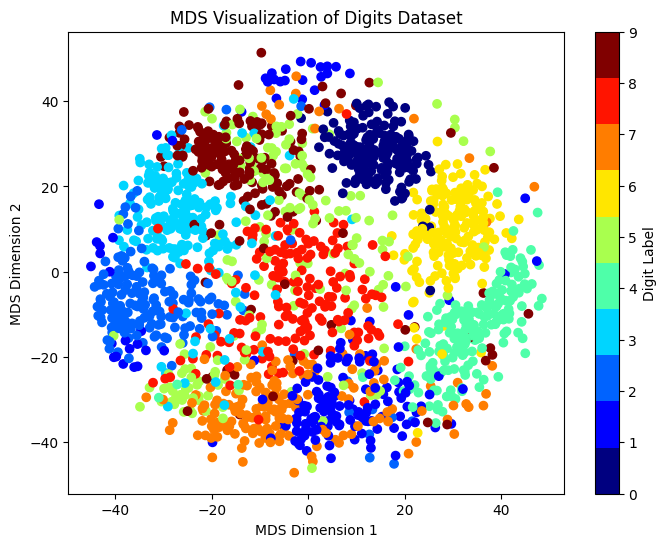

In [383]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
from sklearn.manifold import MDS

# Load a sample dataset (e.g., the digits dataset)
data = load_digits()
X, y = data.data, data.target

print('Original Dimesnion of X = ', X.shape)
# Create an MDS model with the desired number of dimensions
# Number of dimensions for visualization
n_components = 2  
mds = MDS(n_components=n_components)

# Fit the MDS model to your data
X_reduced = mds.fit_transform(X)

print('Dimesnion of X after MDS = ',X_reduced.shape)

# Visualize the reduced data
plt.figure(figsize=(8, 6))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap=plt.cm.get_cmap("jet", 10))
plt.colorbar(label='Digit Label', ticks=range(10))
plt.title("MDS Visualization of Digits Dataset")
plt.xlabel("MDS Dimension 1")
plt.ylabel("MDS Dimension 2")
plt.show()

# Create df column with cosine similarity of each vector to the average

In [23]:
ok["average_vector"] = ok.groupby("quote_id")[["vector"]].transform("mean")

In [24]:
ok["cosine_similarity_with_average"] = ok.apply(lambda row: cosine_similarity(row["vector"], row["average_vector"]), axis=1)

In [25]:
ok.sort_values(["quote_id", "cosine_similarity_with_average"], ascending=[True, False], inplace=True)

In [84]:
pd.set_option('display.max_rows', 100)  # Displays up to 100 rows

In [85]:
ok[["id", "text", "quote_id", "book_id", "cosine_similarity_with_average"]]

,id,text,quote_id,book_id,cosine_similarity_with_average
0,NaN,translation_average,0,NaN,1.000000
0,0.0,"Every art and every inquiry, and similarly eve...",0,0.0,0.967104
3,3.0,"Every art and every inquiry, and similarly eve...",0,3.0,0.955828
2,2.0,"Every art and every investigation, and similar...",0,2.0,0.946487
1,1.0,"Every art, and every science reduced to a teac...",0,1.0,0.904236
1,NaN,translation_average,1,NaN,1.000000
4,4.0,"We must be content, then, in speaking of such ...",1,0.0,0.931686
6,6.0,Therefore in discussing subjects and arguing f...,1,2.0,0.906594
7,7.0,"It would certainly be desirable enough, then, ...",1,3.0,0.880709
5,5.0,"We must be content then, in speaking of such t...",1,1.0,0.869698


In [86]:
ok.groupby("book_id")[["cosine_similarity_with_average"]].agg("sum")

,cosine_similarity_with_average
book_id,
0.0,16.288201
1.0,15.576884
2.0,15.819822
3.0,16.010980


In [87]:
cols = ["id", "text", "quote_id", "vector", "book_id"]
crossed = ok[cols].merge(ok[cols], how="cross")

In [88]:
crossed

,id_x,text_x,quote_id_x,vector_x,book_id_x,id_y,text_y,quote_id_y,vector_y,book_id_y
0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN
1,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0
2,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0
3,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0
4,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0
...,...,...,...,...,...,...,...,...,...,...
8095,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,translation_average,17,"[0.02890929952263832, 0.03860926255583763, 0.0...",NaN
8096,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,Shame should not be described as a virtue; for...,17,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...",0.0
8097,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",3.0
8098,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,"To speak of Shame as a Virtue is incorrect, be...",17,"[0.035061073, 0.03301282, -0.006102627, 0.0407...",1.0


In [89]:
crossed["cos_sim"] = crossed.apply(lambda row: cosine_similarity(row["vector_x"], row["vector_y"]), axis=1)

In [90]:
crossed

,id_x,text_x,quote_id_x,vector_x,book_id_x,id_y,text_y,quote_id_y,vector_y,book_id_y,cos_sim
0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,1.000000
1,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,0.967104
2,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,0.955828
3,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0,0.946487
4,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0,0.904236
...,...,...,...,...,...,...,...,...,...,...,...
8095,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,translation_average,17,"[0.02890929952263832, 0.03860926255583763, 0.0...",NaN,0.729205
8096,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,Shame should not be described as a virtue; for...,17,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...",0.0,0.533468
8097,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",3.0,0.532607
8098,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,"To speak of Shame as a Virtue is incorrect, be...",17,"[0.035061073, 0.03301282, -0.006102627, 0.0407...",1.0,0.500979


In [95]:
pd.set_option('display.max_rows', 101)  # Displays up to 100 rows

In [105]:
sorted_crossed = crossed.sort_values(["quote_id_x", "quote_id_y", "cos_sim"], ascending=[True, True, False])

In [106]:
sorted_crossed

,id_x,text_x,quote_id_x,vector_x,book_id_x,id_y,text_y,quote_id_y,vector_y,book_id_y,cos_sim
364,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0,1.000000
0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,1.000000
91,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,1.000000
182,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,1.000000
273,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...
8096,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,Shame should not be described as a virtue; for...,17,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...",0.0,0.533468
7919,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",3.0,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,0.532607
8097,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",3.0,0.532607
8009,NaN,"To speak of Shame as a Virtue is incorrect, be...",17,"[0.035061073, 0.03301282, -0.006102627, 0.0407...",1.0,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,0.500979


In [107]:
sorted_crossed[sorted_crossed["id_x"] != sorted_crossed["id_y"]]

,id_x,text_x,quote_id_x,vector_x,book_id_x,id_y,text_y,quote_id_y,vector_y,book_id_y,cos_sim
0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,1.000000
1,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,0.967104
90,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,0.967104
2,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,0.955828
180,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,NaN,translation_average,0,"[0.06277847290039062, 0.006201472133398056, 0....",NaN,0.955828
...,...,...,...,...,...,...,...,...,...,...,...
8096,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,Shame should not be described as a virtue; for...,17,"[-0.0040379125, 0.02900942, 0.041195996, 0.061...",0.0,0.533468
7919,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",3.0,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,0.532607
8097,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,NaN,It is not fitting to speak about a sense of sh...,17,"[0.009842148, 0.027751027, 0.03613974, 0.06778...",3.0,0.532607
8009,NaN,"To speak of Shame as a Virtue is incorrect, be...",17,"[0.035061073, 0.03301282, -0.006102627, 0.0407...",1.0,NaN,It is not correct to speak of modesty as a kin...,17,"[0.07477189, 0.06466378, -0.001127524, 0.05559...",2.0,0.500979


In [125]:
sorted_crossed["pair_key"] = sorted_crossed.apply(lambda row: frozenset([row["id_x"], row["id_y"]]), axis=1)

In [126]:
slimmed_crossed = sorted_crossed.drop_duplicates("pair_key").drop(columns=["pair_key"])

In [138]:
slimmed_crossed = slimmed_crossed[(slimmed_crossed["text_x"] != "translation_average") & (slimmed_crossed["text_y"] != "translation_average")]

In [140]:
final_df = slimmed_crossed[slimmed_crossed["id_x"] != slimmed_crossed["id_y"]].sort_values(["quote_id_x", "quote_id_y", "cos_sim"], ascending=[True, True, False])

In [148]:
final_df[final_df.quote_id_x.isin([0]) & final_df.quote_id_y.isin([0])]

,id_x,text_x,quote_id_x,vector_x,book_id_x,id_y,text_y,quote_id_y,vector_y,book_id_y,cos_sim
92,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,0.921333
93,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0,0.898262
183,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0,0.888366
94,0.0,"Every art and every inquiry, and similarly eve...",0,"[0.067723036, 0.0053726034, -0.0019922277, -0....",0.0,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0,0.829923
184,3.0,"Every art and every inquiry, and similarly eve...",0,"[0.07647041, -0.00835362, 0.011748879, -0.0462...",3.0,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0,0.797265
274,2.0,"Every art and every investigation, and similar...",0,"[0.06353351, -0.00046575806, -0.0013663276, -0...",2.0,1.0,"Every art, and every science reduced to a teac...",0,"[0.043386947, 0.028252663, 0.0019536903, -0.03...",1.0,0.785087


In [28]:
virtues = [
    "courage",
    "temperance",
    "generosity",
    "good-temperedness",
    "proper pride",
    "friendliness",
    "good-humoredness",
    "modesty",
]

In [29]:
vices = [
    "cowardice",
    "rashness",
    "abstinence",
    "overindulgence",
    "stinginess",
    "wastefulness",
    "poor self-esteem",
    "arrogance",
    "apathy",
    "irascibility",
    "quarrelsomeness",
    "obsequiousness",
    "flattery",
    "boorishness",
    "buffonery",
    "shyness",
    "shamelessness",
]

In [30]:
things = virtues + vices

In [31]:
embeddings = model.encode(things)

In [32]:
embeddings.shape

(25, 384)

In [33]:
embeddings

array([[-0.01581755,  0.11540195, -0.06541064, ..., -0.01043045,
         0.08688091, -0.06637891],
       [ 0.02989006,  0.0109904 , -0.02283486, ...,  0.009248  ,
         0.02026339, -0.06642797],
       [-0.03906918,  0.10393869, -0.00202836, ...,  0.01034176,
         0.0162704 , -0.09457789],
       ...,
       [-0.02661214,  0.05654096, -0.03713977, ..., -0.01198719,
         0.10783958, -0.01496092],
       [ 0.02254634, -0.04937399,  0.04211659, ...,  0.02660833,
        -0.05187063,  0.00056743],
       [ 0.00077189,  0.09860763,  0.00731954, ..., -0.05565066,
         0.01143267, -0.10664658]], shape=(25, 384), dtype=float32)

In [34]:
things[0]

'courage'

In [35]:
embeddings[0]

array([-1.58175528e-02,  1.15401946e-01, -6.54106364e-02,  2.29506139e-02,
        2.52055954e-02,  6.28468618e-02,  3.23648080e-02, -5.47691546e-02,
        5.56398481e-02, -5.20693511e-02,  2.84247957e-02, -1.18830763e-02,
        6.27969056e-02, -7.07897842e-02, -2.16767788e-02,  2.89742630e-02,
       -3.99560407e-02,  4.98627536e-02, -1.16839036e-01, -1.85486097e-02,
       -9.98935327e-02,  7.28677725e-03,  2.48636883e-02,  1.20441681e-02,
       -5.94298765e-02,  5.88865913e-02,  1.23103205e-02,  3.86210307e-02,
        8.39496627e-02, -6.76595122e-02,  3.44258249e-02, -6.35362566e-02,
        8.52421597e-02, -2.99044475e-02, -4.29430194e-02,  4.22700197e-02,
        6.01995140e-02, -2.26161405e-02,  3.92179750e-03, -2.53279060e-02,
       -4.11208309e-02, -6.73621474e-03,  1.98976640e-02,  2.67552193e-02,
       -3.12655792e-02,  6.12492487e-03, -2.83308867e-02, -3.93827148e-02,
        2.43864581e-02, -2.80064419e-02,  9.18649137e-03, -3.56554762e-02,
       -1.70010284e-01, -

In [36]:
data = {thing: vector for thing, vector in zip(things, embeddings)}

In [37]:
data["generosity"]

array([-3.90691794e-02,  1.03938691e-01, -2.02835817e-03,  4.31976132e-02,
       -2.87106205e-02,  1.90873779e-02,  1.00729950e-01, -4.98232385e-03,
        3.15301213e-03,  3.22986953e-02,  6.78042546e-02, -1.00665530e-02,
       -5.49636781e-04, -1.47222355e-02,  3.17190564e-03, -3.04856431e-02,
        4.98863682e-03, -2.64416486e-02, -1.45568699e-01,  1.02572516e-02,
       -6.11669458e-02, -9.47771370e-02,  3.52822733e-03, -2.46729096e-03,
        3.25474190e-03,  4.07497212e-02, -3.05154826e-02, -5.00036962e-02,
        7.78350309e-02, -7.24310279e-02,  3.09406035e-02,  1.03332624e-02,
        6.13566414e-02,  1.23521471e-02, -5.67023680e-02,  5.46404943e-02,
        4.77989987e-02, -1.68652721e-02, -1.95574407e-02, -1.22268293e-02,
       -2.23760512e-02, -5.11286631e-02,  1.35424081e-02,  2.39464827e-03,
       -3.80841047e-02, -3.03549916e-02,  6.96544722e-02,  4.57603373e-02,
       -3.63946632e-02, -3.50136235e-02,  3.82912494e-02,  3.30467173e-03,
       -7.81932250e-02,  

In [38]:
similarities = {}
scalar_grid = []

for trait1, vector1 in tqdm(data.items()):
    scalar_row = []
    for trait2, vector2 in data.items():
        key = (trait1, trait2)
        similarity = cosine_similarity(vector1, vector2)
        similarities[key] = similarity
        scalar_row.append(similarity)
    scalar_grid.append(scalar_row)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 5379.80it/s]


In [39]:
# some kind of 2d histogram and/or density heat map

In [40]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

In [41]:
np_grid = np.array(scalar_grid)
np_grid[np_grid < 0.5] = 0

[Text(0, 0, 'courage'),
 Text(0, 1, 'temperance'),
 Text(0, 2, 'generosity'),
 Text(0, 3, 'good-temperedness'),
 Text(0, 4, 'proper pride'),
 Text(0, 5, 'friendliness'),
 Text(0, 6, 'good-humoredness'),
 Text(0, 7, 'modesty'),
 Text(0, 8, 'cowardice'),
 Text(0, 9, 'rashness'),
 Text(0, 10, 'abstinence'),
 Text(0, 11, 'overindulgence'),
 Text(0, 12, 'stinginess'),
 Text(0, 13, 'wastefulness'),
 Text(0, 14, 'poor self-esteem'),
 Text(0, 15, 'arrogance'),
 Text(0, 16, 'apathy'),
 Text(0, 17, 'irascibility'),
 Text(0, 18, 'quarrelsomeness'),
 Text(0, 19, 'obsequiousness'),
 Text(0, 20, 'flattery'),
 Text(0, 21, 'boorishness'),
 Text(0, 22, 'buffonery'),
 Text(0, 23, 'shyness'),
 Text(0, 24, 'shamelessness')]

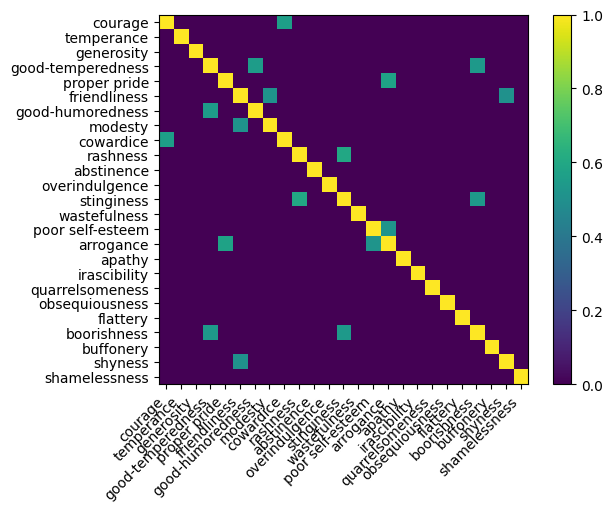

In [42]:
im = plt.imshow(np_grid, vmin=0, vmax=1)
plt.colorbar(im)
ax = plt.gca()

ax.set_xticks(np.arange(len(things))) # Positions for x-axis ticks
ax.set_xticklabels(things, rotation=45, ha="right")

ax.set_yticks(np.arange(len(things))) # Positions for x-axis ticks
ax.set_yticklabels(things)

In [43]:
similarities[("courage", "cowardice")]

np.float32(0.5602837)

In [44]:
similarities[("good-temperedness", "good-humoredness")]

np.float32(0.5529269)

In [45]:
np_grid[12][9]

np.float32(0.6013253)

In [46]:
things[12]

'stinginess'

In [47]:
things[9]

'rashness'